In [18]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

##### import data

In [19]:
#apartment rental data
rent11 = pd.read_csv('apartments_rent_pl_2023_11.csv')
rent11 = rent11.assign(date='November 2023')

rent12 = pd.read_csv('apartments_rent_pl_2023_12.csv')
rent12 = rent12.assign(date='December 2023')

df = pd.concat([rent11, rent12])

#I am only interested in Warsaw data
df = df[df['city'] == 'warszawa'].copy()
df.drop(columns=['id', 'city'], inplace=True)

df.head()

,type,squareMeters,rooms,floor,floorCount,buildYear,latitude,longitude,centreDistance,poiCount,...,ownership,buildingMaterial,condition,hasParkingSpace,hasBalcony,hasElevator,hasSecurity,hasStorageRoom,price,date
4660,apartmentBuilding,47.0,2.0,8.0,9.0,2020.0,52.257912,20.968610,3.76,33.0,...,condominium,brick,premium,yes,yes,yes,no,no,5000,November 2023
4661,NaN,27.0,1.0,3.0,7.0,2020.0,52.249800,21.035200,2.95,33.0,...,condominium,NaN,NaN,yes,yes,yes,no,no,2950,November 2023
4662,apartmentBuilding,51.0,2.0,5.0,7.0,2010.0,52.222864,21.009959,1.08,85.0,...,condominium,brick,NaN,no,yes,yes,no,no,3700,November 2023
4663,tenement,50.0,3.0,3.0,5.0,1913.0,52.224948,21.012136,0.95,124.0,...,condominium,brick,NaN,no,no,yes,no,no,5000,November 2023
4664,tenement,39.8,2.0,2.0,3.0,1939.0,52.216513,21.041474,3.09,6.0,...,condominium,brick,NaN,no,no,no,no,no,4500,November 2023


In [20]:
# let's check the data type and whether there are empty values
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7244 entries, 4660 to 8676
Data columns (total 27 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   type                  4964 non-null   object 
 1   squareMeters          7244 non-null   float64
 2   rooms                 7244 non-null   float64
 3   floor                 6509 non-null   float64
 4   floorCount            7138 non-null   float64
 5   buildYear             5252 non-null   float64
 6   latitude              7244 non-null   float64
 7   longitude             7244 non-null   float64
 8   centreDistance        7244 non-null   float64
 9   poiCount              7244 non-null   float64
 10  schoolDistance        7244 non-null   float64
 11  clinicDistance        7243 non-null   float64
 12  postOfficeDistance    7244 non-null   float64
 13  kindergartenDistance  7234 non-null   float64
 14  restaurantDistance    7218 non-null   float64
 15  collegeDistance   

##### null values

In [25]:
#pip install missingno


Note: you may need to restart the kernel to use updated packages.Requirement already satisfied: missingno in c:\users\julia\anaconda3\lib\site-packages (0.5.2)



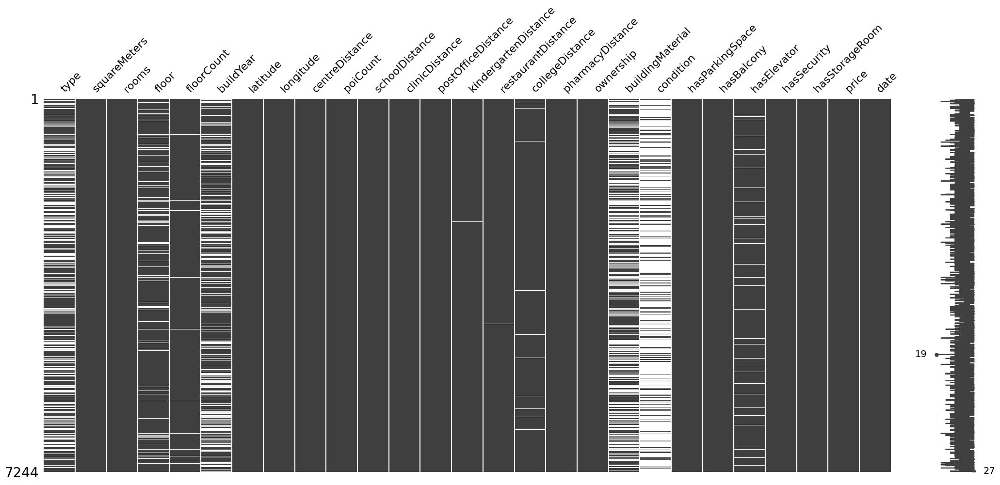

In [21]:
# let's check where and how much data is missing
import missingno as msno

msno.matrix(df)
plt.show()

C:\Users\julia\AppData\Local\Temp\ipykernel_2092\1555659973.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), cmap='YlGnBu', annot=True)


<Axes: >

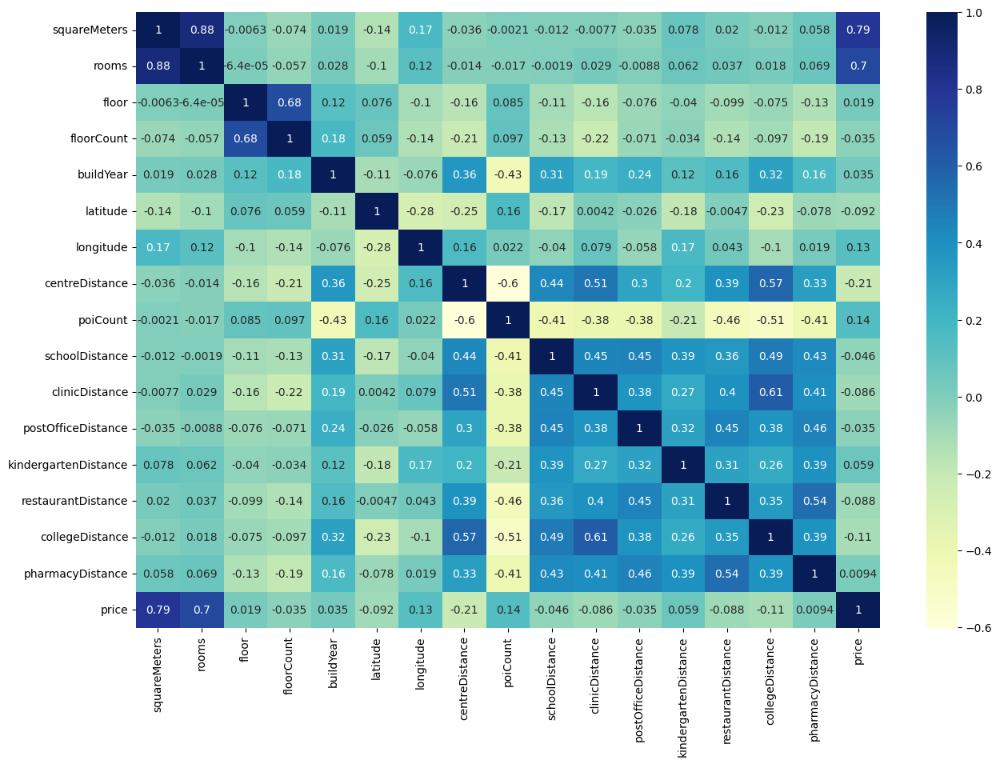

In [22]:
plt.figure(figsize=(15,10))
sns.heatmap(df.corr(), cmap='YlGnBu', annot=True)

In [23]:
print(df['ownership'].nunique())

1


In [24]:
# Several columns have a lot of missing values.
# at the same time, these values ​​do not have such an impact on the price. Let's just remove them
# I also remove ownership since it only takes one value

rare_columns = ['type', 'floor', 'floorCount', 'buildYear', 'buildingMaterial','condition','hasElevator',
                'schoolDistance', 'clinicDistance','kindergartenDistance','restaurantDistance','collegeDistance',
                'pharmacyDistance','postOfficeDistance','ownership']
df.drop(columns=rare_columns, inplace=True)

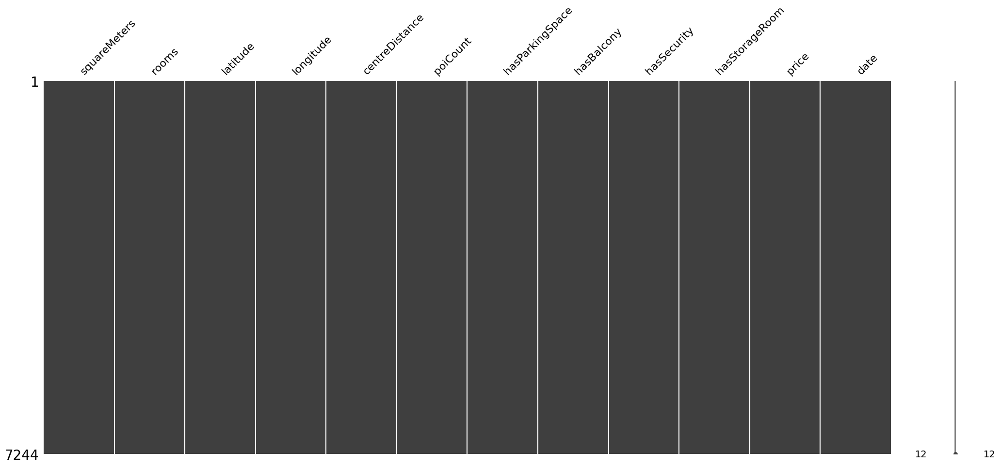

In [25]:
msno.matrix(df)
plt.show()


##### EDA

array([[<Axes: title={'center': 'squareMeters'}>,
        <Axes: title={'center': 'rooms'}>,
        <Axes: title={'center': 'latitude'}>],
       [<Axes: title={'center': 'longitude'}>,
        <Axes: title={'center': 'centreDistance'}>,
        <Axes: title={'center': 'poiCount'}>],
       [<Axes: title={'center': 'price'}>, <Axes: >, <Axes: >]],
      dtype=object)

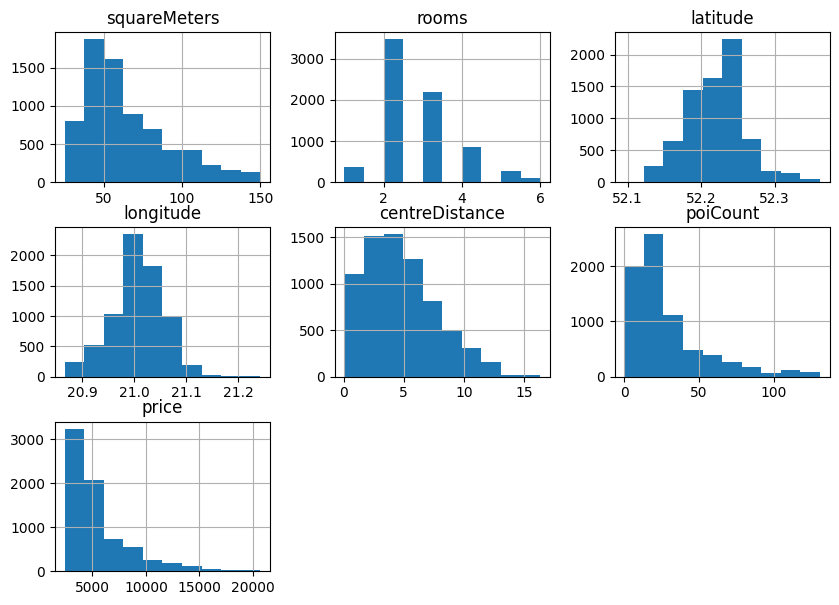

In [28]:
df.hist(figsize=(10,7))

C:\Users\julia\AppData\Local\Temp\ipykernel_2092\1411751928.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), cmap='YlGnBu', annot=True)


<Axes: >

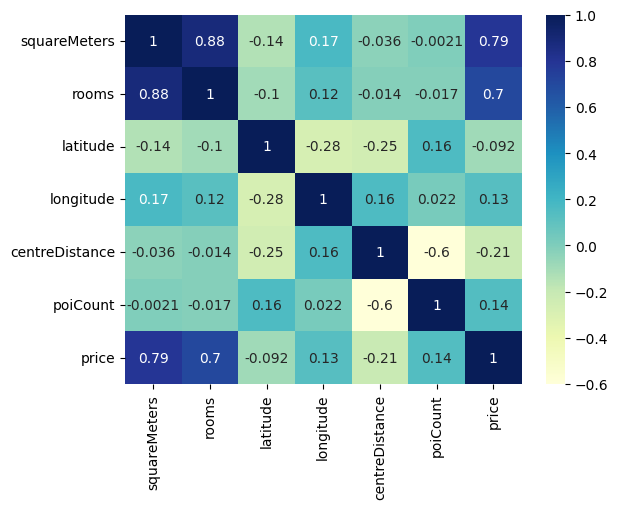

In [48]:
sns.heatmap(df.corr(), cmap='YlGnBu', annot=True)

The size of the apartment and the number of rooms are most correlated with the price of the apartment

##### on map

<Axes: xlabel='longitude', ylabel='latitude'>

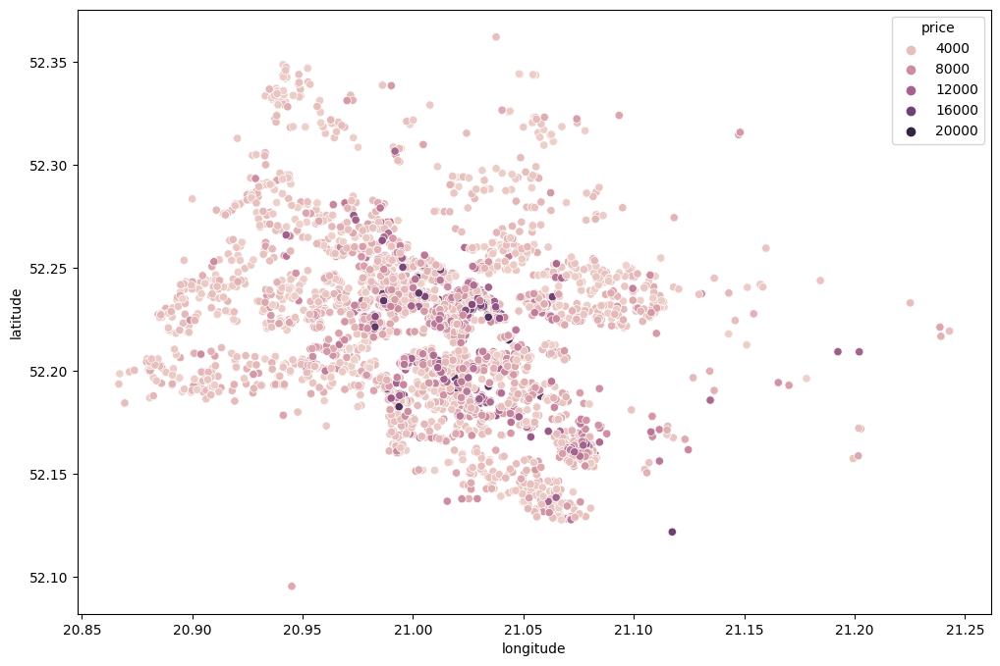

In [29]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='longitude',y='latitude',data=df,hue='price')

It looks like apartments in the center of Warsaw and along the metro lines tend to be more expensive 

In [32]:
#pip install folium

Note: you may need to restart the kernel to use updated packages.


In [39]:
import folium as folium

m = folium.Map(location=[52.237, 21.017], zoom_start=12)


# Adding points to the map
for index, row in df.iterrows():
    # Uzyskiwanie koloru z palety viridis w zakresie [0, 1]
    color = sns.color_palette("flare", as_cmap=True)(row['price'] / df['price'].max())
    
    # Zamiana koloru na format heksadecymalny
    hex_color = "#{:02x}{:02x}{:02x}".format(int(color[0]*255), int(color[1]*255), int(color[2]*255))

    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=3,
        popup=f"Price: {row['price']}",
        color=hex_color,
        fill=True,
        fill_color=hex_color,
        fill_opacity=0.7,
    ).add_to(m)

# Wyświetlanie mapy
m


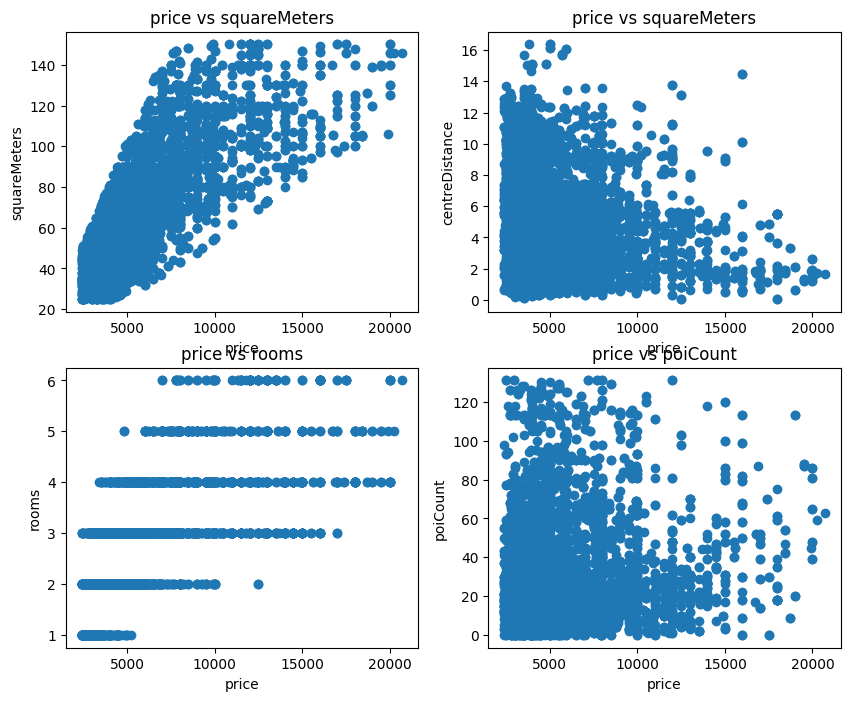

In [44]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))

plt.subplot(2, 2, 1)
plt.scatter(df['price'], df['squareMeters'])
plt.xlabel('price')
plt.ylabel('squareMeters')
plt.title('price vs squareMeters')

plt.subplot(2, 2, 2)
plt.scatter(df['price'], df['centreDistance'])
plt.xlabel('price')
plt.ylabel('centreDistance')
plt.title('price vs squareMeters')

plt.subplot(2, 2, 3)
plt.scatter(df['price'], df['rooms'])
plt.xlabel('price')
plt.ylabel('rooms')
plt.title('price vs rooms')

plt.subplot(2, 2, 4)
plt.scatter(df['price'], df['poiCount'])
plt.xlabel('price')
plt.ylabel('poiCount')
plt.title('price vs poiCount')

plt.show()


In [45]:
# Eksport do pliku CSV
df.to_csv('Warsaw_rent_cleaned.csv', index=False)
